In [1]:
#imports
import os
import pandas as pd

# os.chdir('C:/Users/mattalah/Desktop/solar')

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error
from lightgbm import LGBMRegressor
import numpy as np
import itertools


from sktime.forecasting.compose import make_reduction
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.forecasting.arima import AutoARIMA
from sktime.forecasting.ets import AutoETS

import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

seed_value = 123

In [4]:
energy_production = pd.read_csv('dataset/Solar_Energy_Production.csv')
energy_production_sites = pd.read_csv('dataset/Solar_Photovoltaic_Sites.csv')


In [5]:
energy_production_sites.head(5)

,id,name,address_orig,address,latitude,longitude,location,installationDate,public_url,manufacturerName,modelName,maximumPower,City Quadrants,Ward Boundaries,Calgary Communities
0,NaN,Municipal Building,800 MacLeod TR SE,800 MACLEOD TR SE,51.045414,-114.056546,"(51.04541403, -114.0565464)",2008/01/01,NaN,NaN,NaN,NaN,3,7,262
1,NaN,Fire Station No. 30 - McKenzie Towne,6 McKenzie Towne GA SE,6 MCKENZIE TOWNE GA SE,50.916432,-113.963070,"(50.91643163, -113.963069726759)",2010/01/01,NaN,NaN,NaN,NaN,3,4,46
2,NaN,Ralph Klein Legacy Park,12350 84 ST SE,12350 84 ST SE,50.937563,-113.903017,"(50.93756317, -113.9030174)",2010/01/01,NaN,NaN,NaN,NaN,3,4,211
3,NaN,Fire Station No. 8 – Rosscarrock,1720 45 ST SW,1720 45 ST SW,51.038673,-114.152118,"(51.03867255, -114.1521183)",2011/01/01,NaN,NaN,NaN,NaN,1,14,281
4,NaN,Fire Station No. 22 - Temple,7199 Temple DR NW,7199 TEMPLE DR NE,51.091770,-113.957493,"(51.09177006, -113.9574929)",2011/01/01,NaN,NaN,NaN,NaN,4,9,22


In [6]:
energy_production

,name,id,address,date,kWh,public_url,installationDate,uid
0,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 08:00:00 AM,1.130,https://monitoring.solaredge.com/solaredge-web...,2016/11/07,3141062017-09-11 08:00:00
1,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 09:00:00 AM,2.340,https://monitoring.solaredge.com/solaredge-web...,2016/11/07,3141062017-09-11 09:00:00
2,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 10:00:00 AM,3.656,https://monitoring.solaredge.com/solaredge-web...,2016/11/07,3141062017-09-11 10:00:00
3,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 11:00:00 AM,4.577,https://monitoring.solaredge.com/solaredge-web...,2016/11/07,3141062017-09-11 11:00:00
4,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 12:00:00 PM,6.506,https://monitoring.solaredge.com/solaredge-web...,2016/11/07,3141062017-09-11 12:00:00
...,...,...,...,...,...,...,...,...
258418,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 03:00:00 PM,201.285,https://monitoringpublic.solaredge.com/solared...,2017/10/31,5776502023-03-12 15:00:00
258419,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 04:00:00 PM,162.582,https://monitoringpublic.solaredge.com/solared...,2017/10/31,5776502023-03-12 16:00:00
258420,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 05:00:00 PM,107.060,https://monitoringpublic.solaredge.com/solared...,2017/10/31,5776502023-03-12 17:00:00
258421,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 06:00:00 PM,43.074,https://monitoringpublic.solaredge.com/solared...,2017/10/31,5776502023-03-12 18:00:00


### Null values 

In [7]:
nulls = pd.DataFrame(energy_production.isna().mean() * 100, columns=['percentage_of_nulls'])
nulls

,percentage_of_nulls
name,0.0
id,0.0
address,0.0
date,0.0
kWh,0.0
public_url,0.0
installationDate,0.0
uid,0.0


In [8]:
nulls_sites = pd.DataFrame(energy_production_sites.isna().mean() * 100, columns=['percentage_of_nulls'])
nulls_sites

,percentage_of_nulls
id,47.619048
name,0.000000
address_orig,0.000000
address,0.000000
latitude,0.000000
longitude,0.000000
location,0.000000
installationDate,4.761905
public_url,47.619048
manufacturerName,47.619048


### check if each id in your DataFrame corresponds to only one site_name

In [9]:
energy_production.groupby('id')['name'].agg(lambda x: ', '.join(set(x)))

id
164440                     Southland Leisure Centre
308057    Hillhurst Sunnyside Community Association
314106               Calgary Fire Hall Headquarters
319086               Whitehorn Multi-Service Centre
331901    City of Calgary North Corporate Warehouse
332785          Richmond - Knob Hill Community Hall
355827               Glenmore Water Treatment Plant
551172                              CFD Firehall #7
570079                        Manchester Building M
577650               Bearspaw Water Treatment Plant
594148                                  Telus Spark
Name: name, dtype: object

In [10]:
energy_production_sites.groupby('id')['name'].agg(lambda x: ', '.join(set(x)))

id
164440.0                     Southland Leisure Centre
308057.0    Hillhurst Sunnyside Community Association
314106.0               Calgary Fire Hall Headquarters
319086.0               Whitehorn Multi-Service Centre
331901.0    City of Calgary North Corporate Warehouse
332785.0          Richmond - Knob Hill Community Hall
355827.0               Glenmore Water Treatment Plant
551172.0                              CFD Firehall #7
570079.0                        Manchester Building M
577650.0        CoC Bearspaw Water Treatment Plant PV
594148.0                                  Telus Spark
Name: name, dtype: object

In [11]:
array2 = set(energy_production['id'].unique())
array1 = set(energy_production_sites['id'].unique())
same_elements = set(array1) - set(array2)
same_elements

{nan}

If this list is empty that means every id as a match

### Merge datasets on id

In [12]:
energy_production.columns
energy_production = energy_production[['name', 'id', 'address', 'date', 'kWh']]
energy_production

,name,id,address,date,kWh
0,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 08:00:00 AM,1.130
1,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 09:00:00 AM,2.340
2,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 10:00:00 AM,3.656
3,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 11:00:00 AM,4.577
4,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 12:00:00 PM,6.506
...,...,...,...,...,...
258418,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 03:00:00 PM,201.285
258419,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 04:00:00 PM,162.582
258420,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 05:00:00 PM,107.060
258421,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 06:00:00 PM,43.074


In [13]:
energy_production_sites.columns
energy_production_sites = energy_production_sites[['id', 'latitude', 'longitude']]
energy_production_sites

,id,latitude,longitude
0,NaN,51.045414,-114.056546
1,NaN,50.916432,-113.963070
2,NaN,50.937563,-113.903017
3,NaN,51.038673,-114.152118
4,NaN,51.091770,-113.957493
5,NaN,50.957431,-114.121390
6,NaN,51.037227,-114.189256
7,NaN,51.026009,-114.094948
8,NaN,51.104155,-114.253203
9,164440.0,50.962485,-114.108472


In [20]:
type(energy_production_sites["id"].values)

numpy.ndarray

In [14]:
merged_df = pd.merge(energy_production, energy_production_sites,on='id', how='left')
merged_df

,name,id,address,date,kWh,latitude,longitude
0,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 08:00:00 AM,1.130,51.016189,-114.036667
1,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 09:00:00 AM,2.340,51.016189,-114.036667
2,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 10:00:00 AM,3.656,51.016189,-114.036667
3,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 11:00:00 AM,4.577,51.016189,-114.036667
4,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 12:00:00 PM,6.506,51.016189,-114.036667
...,...,...,...,...,...,...,...
258418,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 03:00:00 PM,201.285,51.104990,-114.250011
258419,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 04:00:00 PM,162.582,51.104990,-114.250011
258420,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 05:00:00 PM,107.060,51.104990,-114.250011
258421,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 06:00:00 PM,43.074,51.104990,-114.250011


#### convert date column to datetime 

In [15]:
merged_df['date'] = pd.to_datetime(merged_df['date'])
merged_df.rename(columns={'kWh': 'GHI'}, inplace=True)
merged_df = merged_df.sort_values(by=['name', 'date'])

### visualisation 

In [21]:
m1 = merged_df[merged_df['id'] == 577650]

In [22]:
m2 = m1.sort_values(by='date')
m2

,name,id,address,date,GHI,latitude,longitude
35809,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 10:45:00,0.970,51.10499,-114.250011
35810,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 11:45:00,23.927,51.10499,-114.250011
35811,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 12:45:00,69.659,51.10499,-114.250011
35812,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 13:45:00,59.172,51.10499,-114.250011
35813,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 14:45:00,18.061,51.10499,-114.250011
...,...,...,...,...,...,...,...
254688,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023-03-16 15:00:00,182.748,51.10499,-114.250011
254689,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023-03-16 16:00:00,152.644,51.10499,-114.250011
254690,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023-03-16 17:00:00,100.145,51.10499,-114.250011
254691,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023-03-16 18:00:00,40.493,51.10499,-114.250011


In [23]:
fig = px.line(
    merged_df, 
    x='date', 
    y='GHI', 
    color='name', 
    facet_col='name',  
    facet_col_wrap=2,  
    title="Solar Generation Time Series for All Sites"
)

fig.update_layout(
    xaxis_title='Datetime',
    yaxis_title='Solar Generation (kWh)',
    template='plotly_dark',  
    height=900,  # Adjust height to accommodate multiple plots
    width=1200
)

# Show the plot
fig.show()

In [24]:
import openmeteo_requests
import requests_cache
from retry_requests import retry
from datetime import datetime
import requests

In [138]:
import requests
import pandas as pd
from datetime import datetime
import time  # Import time for adding delay

def api(start_date, end_date, latitude, longitude):
    """API call function with a delay between requests."""
    
    date_string_1 = start_date + "T" + "00:00"
    date_string_2 = end_date + "T" + "00:00"

    date_object1 = datetime.strptime(date_string_1, "%Y-%m-%dT%H:%M")
    date_object2 = datetime.strptime(date_string_2, "%Y-%m-%dT%H:%M")

    date_only1 = date_object1.date()
    date_only2 = date_object2.date()
    date_string_1 = str(date_only1)
    date_string_2 = str(date_only2)

    x = [(latitude, longitude)]
    li = []

    for i in x:
        params = {
            "latitude": i[0],
            "longitude": i[1],
            "start_date": date_string_1,
            "end_date": date_string_2,
            "timezone": "auto",
            "temperature_unit": "fahrenheit",
            "windspeed_unit": "mph",
            "precipitation_unit": "inch",
            "hourly": {
                "precipitation",
                "snowfall",
                "temperature_2m",
                "relativehumidity_2m",
                "surface_pressure",
                "windspeed_10m",
                "winddirection_10m",
                "windgusts_10m",
                "cloudcover",
            },
            "daily": {"sunrise", "sunset"},
        }

        try:
            response = requests.get("https://archive-api.open-meteo.com/v1/era5", params=params, timeout=10)
            response.raise_for_status()  # Raise an error for bad responses (4xx/5xx)
            
            res = response.json()

            df3 = pd.DataFrame.from_dict(res["daily"], orient="index").T
            df3 = df3.loc[df3.index.repeat(24)].reset_index(drop=True)
            df2 = pd.DataFrame.from_dict(res["hourly"], orient="index").T
            df2 = df2.assign(
                elevation=res["elevation"],
                latitude=res["latitude"],
                longitude=res["longitude"],
                timezone=res["timezone_abbreviation"],
            )
            df2["sunrise"] = df3["sunrise"]
            df2["sunset"] = df3["sunset"]
            li.append(df2)
        except requests.exceptions.Timeout:
            print(f"Request timed out for coordinates: {i}")
        except requests.exceptions.RequestException as e:
            print(f"Request failed: {e}")

    if li:
        frame = pd.concat(li, axis=0, ignore_index=True)
        print("Request OK")
        return frame, res
    else:
        print("Request FAILED")
        return None, None


In [139]:
from datetime import datetime,timedelta

timestamp = datetime.now()

start_of_week = timestamp - timedelta(days=14)

end_of_week = timestamp - timedelta(days=7)


In [140]:
start_time = start_of_week.strftime("%Y-%m-%d")
end_time = end_of_week.strftime("%Y-%m-%d")

lat = m2["latitude"].mean()
lon = m2["longitude"].mean()

res = api(start_time, end_time, lat, lon)

Request OK


In [131]:
res

(                 time winddirection_10m cloudcover surface_pressure  \
 0    2024-10-10T00:00               274         21            888.7   
 1    2024-10-10T01:00               283          0            888.8   
 2    2024-10-10T02:00               287          0            889.4   
 3    2024-10-10T03:00               310          0            890.5   
 4    2024-10-10T04:00               328          2            891.9   
 ..                ...               ...        ...              ...   
 187  2024-10-17T19:00               263          0            884.6   
 188  2024-10-17T20:00               272          0            885.5   
 189  2024-10-17T21:00               281          0            886.5   
 190  2024-10-17T22:00               288          0            887.2   
 191  2024-10-17T23:00               301          0            887.7   
 
     temperature_2m snowfall windgusts_10m precipitation relativehumidity_2m  \
 0             42.5      0.0           6.5           0

In [101]:
merged_df

,name,id,address,date,GHI,latitude,longitude
35809,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 10:45:00,0.970,51.104990,-114.250011
35810,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 11:45:00,23.927,51.104990,-114.250011
35811,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 12:45:00,69.659,51.104990,-114.250011
35812,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 13:45:00,59.172,51.104990,-114.250011
35813,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 14:45:00,18.061,51.104990,-114.250011
...,...,...,...,...,...,...,...
254615,Whitehorn Multi-Service Centre,319086,3705 35 ST NE,2023-03-16 15:00:00,173.044,51.085895,-113.983594
254616,Whitehorn Multi-Service Centre,319086,3705 35 ST NE,2023-03-16 16:00:00,139.806,51.085895,-113.983594
254617,Whitehorn Multi-Service Centre,319086,3705 35 ST NE,2023-03-16 17:00:00,91.955,51.085895,-113.983594
254618,Whitehorn Multi-Service Centre,319086,3705 35 ST NE,2023-03-16 18:00:00,37.487,51.085895,-113.983594


In [143]:
import time

# Assuming merged_df and the api function are already defined

grouped_conc = merged_df.groupby("id")
frames = []
iteration_count = 0  # Initialize a counter

for id, group in grouped_conc:
    start_time = str(group["date"].iloc[0].date())
    end_time = str(group["date"].iloc[len(group) - 1].date())
    lat = group["latitude"].iloc[0]
    lon = group["longitude"].iloc[0]
    print("---------------------------------------------")
    print(f'Params : \n Start time : {start_time} - End time : {end_time} - Lat : {lat} - Lon : {lon} \n')
    
    # Make API call
    frame, res = api(start_time, end_time, lat, lon)
    frames.append(frame)

    iteration_count += 1  # Increment the iteration count

    # Every 5 iterations, add a 10-second delay
    if iteration_count % 5 == 0:
        print("Pausing for 30 seconds...")
        time.sleep(30)  # Delay for 10 seconds


---------------------------------------------
Params : 
 Start time : 2015-09-01 - End time : 2023-03-16 - Lat : 50.96248466 - Lon : -114.1084722 

Request OK
---------------------------------------------
Params : 
 Start time : 2016-10-03 - End time : 2023-03-15 - Lat : 51.05754059 - Lon : -114.0925026 

Request OK
---------------------------------------------
Params : 
 Start time : 2016-11-24 - End time : 2023-03-16 - Lat : 51.01618884 - Lon : -114.036667015348 

Request OK
---------------------------------------------
Params : 
 Start time : 2017-02-13 - End time : 2023-03-16 - Lat : 51.08589533 - Lon : -113.9835938 



KeyboardInterrupt: 

In [123]:
frame

,time,winddirection_10m,cloudcover,surface_pressure,temperature_2m,snowfall,windgusts_10m,precipitation,relativehumidity_2m,windspeed_10m,elevation,latitude,longitude,timezone,sunrise,sunset
0,2017-11-19T00:00,252,68,888.5,28.1,0.0,15.4,0.0,70,6.6,1047.0,51.072056,-114.03227,MDT,2017-11-19T09:00,2017-11-19T17:43
1,2017-11-19T01:00,246,76,886.9,22.8,0.0,11.4,0.0,73,8.1,1047.0,51.072056,-114.03227,MDT,2017-11-19T09:00,2017-11-19T17:43
2,2017-11-19T02:00,228,81,887.1,26.2,0.0,11.2,0.0,70,6.7,1047.0,51.072056,-114.03227,MDT,2017-11-19T09:00,2017-11-19T17:43
3,2017-11-19T03:00,227,50,886.1,26.0,0.0,12.3,0.0,73,5.2,1047.0,51.072056,-114.03227,MDT,2017-11-19T09:00,2017-11-19T17:43
4,2017-11-19T04:00,223,45,883.9,20.1,0.0,10.5,0.0,74,7.3,1047.0,51.072056,-114.03227,MDT,2017-11-19T09:00,2017-11-19T17:43
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1099,2018-01-03T19:00,298,0,896.2,29.3,0.0,15.2,0.0,76,9.1,1047.0,51.072056,-114.03227,MDT,2018-01-03T09:39,2018-01-03T17:42
1100,2018-01-03T20:00,298,0,895.8,28.0,0.0,15.4,0.0,77,8.9,1047.0,51.072056,-114.03227,MDT,2018-01-03T09:39,2018-01-03T17:42
1101,2018-01-03T21:00,295,0,895.6,26.8,0.0,15.0,0.0,77,8.6,1047.0,51.072056,-114.03227,MDT,2018-01-03T09:39,2018-01-03T17:42
1102,2018-01-03T22:00,297,0,895.4,26.3,0.0,15.2,0.0,77,8.8,1047.0,51.072056,-114.03227,MDT,2018-01-03T09:39,2018-01-03T17:42


In [169]:
test = merged_df[merged_df['id'] == 577650]

grouped_conc = test.groupby("id")
frames = []
for id, group in grouped_conc:
    start_time = str(group["date"].iloc[0].date())
    print(start_time)
    end_time = str(group["date"].iloc[len(group) - 1].date())
    print(end_time)
    lat = group["latitude"].iloc[0]
    print(lat)
    lon = group["longitude"].iloc[0]
    print(lon)
    frame ,res = api(start_time, end_time, lat, lon)

    frames.append(frame)

frame['time'] = pd.to_datetime(frame['time'], format='%Y-%m-%dT%H:%M')
test['time'] = pd.to_datetime(test['date'], format='%Y-%m-%d %H:%M:%S')
frame = frame[['time', 'surface_pressure', 'snowfall', 'temperature_2m',
       'winddirection_10m', 'relativehumidity_2m', 'windgusts_10m',
       'windspeed_10m', 'precipitation', 'cloudcover', 'elevation', 'timezone', 'sunrise', 'sunset']]
df_merged = pd.merge(test, frame, on='time', how='left')
df_merged = pd.merge(test, frame, on='time', how='left')

2017-11-21
2023-03-16
51.10499
-114.250011


In [170]:
df_merged

,name,id,address,date,GHI,latitude,longitude,time,surface_pressure,snowfall,...,winddirection_10m,relativehumidity_2m,windgusts_10m,windspeed_10m,precipitation,cloudcover,elevation,timezone,sunrise,sunset
0,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 10:45:00,0.970,51.10499,-114.250011,2017-11-21 10:45:00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 11:45:00,23.927,51.10499,-114.250011,2017-11-21 11:45:00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 12:45:00,69.659,51.10499,-114.250011,2017-11-21 12:45:00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 13:45:00,59.172,51.10499,-114.250011,2017-11-21 13:45:00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 14:45:00,18.061,51.10499,-114.250011,2017-11-21 14:45:00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24864,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023-03-16 15:00:00,182.748,51.10499,-114.250011,2023-03-16 15:00:00,898.5,0.0,...,315,40,8.1,3.5,0.0,0,1088.0,MDT,2023-03-16T07:47,2023-03-16T19:42
24865,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023-03-16 16:00:00,152.644,51.10499,-114.250011,2023-03-16 16:00:00,898.1,0.0,...,308,37,8.9,4.0,0.0,7,1088.0,MDT,2023-03-16T07:47,2023-03-16T19:42
24866,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023-03-16 17:00:00,100.145,51.10499,-114.250011,2023-03-16 17:00:00,897.8,0.0,...,297,41,8.9,3.5,0.0,0,1088.0,MDT,2023-03-16T07:47,2023-03-16T19:42
24867,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023-03-16 18:00:00,40.493,51.10499,-114.250011,2023-03-16 18:00:00,898.7,0.0,...,148,65,7.4,6.8,0.0,2,1088.0,MDT,2023-03-16T07:47,2023-03-16T19:42


In [195]:
df_merged = df_merged.dropna()

df_merged

,name,id,address,date,GHI,latitude,longitude,time,surface_pressure,snowfall,...,winddirection_10m,relativehumidity_2m,windgusts_10m,windspeed_10m,precipitation,cloudcover,elevation,timezone,sunrise,sunset
6,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-22 09:00:00,20.961,51.10499,-114.250011,2017-11-22 09:00:00,884.2,0.0,...,274,71,19.9,6.5,0.0,0,1088.0,MDT,2017-11-22T09:05,2017-11-22T17:40
8,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-22 10:00:00,50.230,51.10499,-114.250011,2017-11-22 10:00:00,883.8,0.0,...,201,89,11.9,3.1,0.0,0,1088.0,MDT,2017-11-22T09:05,2017-11-22T17:40
10,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-22 11:00:00,236.600,51.10499,-114.250011,2017-11-22 11:00:00,884.3,0.0,...,173,87,8.9,3.6,0.0,3,1088.0,MDT,2017-11-22T09:05,2017-11-22T17:40
12,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-22 12:00:00,399.535,51.10499,-114.250011,2017-11-22 12:00:00,884.3,0.0,...,124,84,8.3,4.0,0.0,2,1088.0,MDT,2017-11-22T09:05,2017-11-22T17:40
14,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-22 13:00:00,398.994,51.10499,-114.250011,2017-11-22 13:00:00,884.4,0.0,...,118,80,7.6,4.3,0.0,2,1088.0,MDT,2017-11-22T09:05,2017-11-22T17:40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24864,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023-03-16 15:00:00,182.748,51.10499,-114.250011,2023-03-16 15:00:00,898.5,0.0,...,315,40,8.1,3.5,0.0,0,1088.0,MDT,2023-03-16T07:47,2023-03-16T19:42
24865,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023-03-16 16:00:00,152.644,51.10499,-114.250011,2023-03-16 16:00:00,898.1,0.0,...,308,37,8.9,4.0,0.0,7,1088.0,MDT,2023-03-16T07:47,2023-03-16T19:42
24866,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023-03-16 17:00:00,100.145,51.10499,-114.250011,2023-03-16 17:00:00,897.8,0.0,...,297,41,8.9,3.5,0.0,0,1088.0,MDT,2023-03-16T07:47,2023-03-16T19:42
24867,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023-03-16 18:00:00,40.493,51.10499,-114.250011,2023-03-16 18:00:00,898.7,0.0,...,148,65,7.4,6.8,0.0,2,1088.0,MDT,2023-03-16T07:47,2023-03-16T19:42


In [258]:
fig = px.line(df_merged, x="date", y='GHI',
              hover_data={"date": "|%B %d, %W"},
              title='K')
fig.update_xaxes(
    dtick="M1",
    tickformat="%b\n%W",
    tickangle=-45)
fig.show()

In [225]:

fig = px.scatter(df_merged, x="GHI", y="cloudcover", log_x=True, size_max=60)
fig.show()


In [231]:

df_merged.dtypes

name                           object
id                              int64
address                        object
date                   datetime64[ns]
GHI                           float64
latitude                      float64
longitude                     float64
time                   datetime64[ns]
surface_pressure               object
snowfall                       object
temperature_2m                 object
winddirection_10m              object
relativehumidity_2m            object
windgusts_10m                  object
windspeed_10m                  object
precipitation                  object
cloudcover                     object
elevation                     float64
timezone                       object
sunrise                        object
sunset                         object
dtype: object

In [232]:
columns_to_convert = ['surface_pressure', 'temperature_2m', 'winddirection_10m', 
                      'relativehumidity_2m', 'windgusts_10m', 'windspeed_10m', 
                      'precipitation', 'cloudcover']
df_merged[columns_to_convert] = df_merged[columns_to_convert].apply(pd.to_numeric, errors='coerce')

df_merged.dtypes


name                           object
id                              int64
address                        object
date                   datetime64[ns]
GHI                           float64
latitude                      float64
longitude                     float64
time                   datetime64[ns]
surface_pressure              float64
snowfall                       object
temperature_2m                float64
winddirection_10m               int64
relativehumidity_2m             int64
windgusts_10m                 float64
windspeed_10m                 float64
precipitation                 float64
cloudcover                      int64
elevation                     float64
timezone                       object
sunrise                        object
sunset                         object
dtype: object

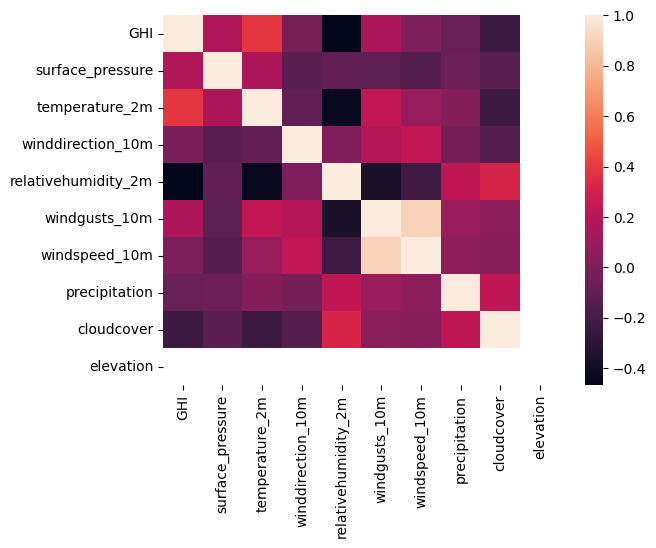

In [256]:
numeric_df = df_merged.select_dtypes(include='number')
numeric_df = numeric_df.drop('id', axis=1)
numeric_df = numeric_df.drop('latitude', axis=1)
numeric_df = numeric_df.drop('longitude', axis=1)


sns.heatmap(numeric_df.corr());